In [ ]:
!pip install lightfm

     |████████████████████████████████| 317kB 6.1MB/s 
  Created wheel for lightfm: filename=lightfm-1.16-cp36-cp36m-linux_x86_64.whl size=704266 sha256=611e537867a7943bbb6d01125486d58f30f8824ea04d553ac2853b04d0687199
  Stored in directory: /root/.cache/pip/wheels/c6/64/d4/673c7277f71ac4c5ad4835b94708c01b653ef2d3aa78ef20aa
Successfully built lightfm


In [ ]:
import numpy as np
import pandas as pd
import tqdm
import re
from lightfm import LightFM

In [ ]:
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import pairwise_distances
import gensim
from scipy.sparse import coo_matrix, csr_matrix
from scipy.sparse.linalg import svds
from sklearn.cluster import KMeans

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
DATA_PATH = '/content/gdrive/MyDrive/Colab Notebooks/recommendation-systems-data'

Mounted at /content/gdrive


Data contains the book rating information. Ratings (Book-Rating) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

### 0. Загрузка данных

In [ ]:
books = pd.read_csv("{}/BX-Books.csv".format(DATA_PATH))
interactions = pd.read_csv("{}/BX-Book-Ratings.csv".format(DATA_PATH), sep=";", encoding = "ISO-8859-1")
users = pd.read_csv('{}/BX-Users.csv'.format(DATA_PATH), delimiter=';', encoding = 'ISO-8859-1')

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [ ]:
interactions.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [ ]:
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [ ]:
print('Размеры датасетов:\nBook ratings: {}\nBooks: {}\nUsers: {}'.format(interactions.shape, books.shape, users.shape))

Размеры датасетов:
Book ratings: (1149780, 3)
Books: (271360, 8)
Users: (278858, 3)


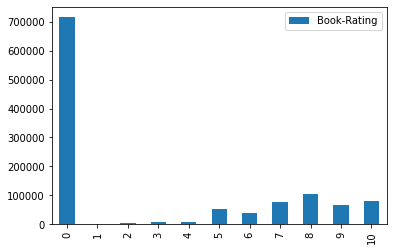

In [ ]:
interactions['Book-Rating'].value_counts(sort=False).plot.bar(legend=True)

Ожидаемо, большинство книг не оценено. Выбросим неоцененные книги

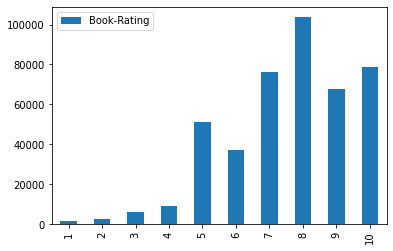

In [ ]:
interactions = interactions[interactions["Book-Rating"] != 0]
interactions['Book-Rating'].value_counts(sort=False).plot.bar(legend=True)

Отбросим юзеров, возраст которых не указан или вызывает сомнения

In [ ]:
users = users.fillna(0.0)
low = np.where(10.0 < users['Age'])[0]
up = np.where(80.0 > users['Age'])[0]
dropped_indexes = np.array(sorted(list(set(low) ^ set(up))))

users.drop(users.index[dropped_indexes], inplace=True)
users.head()

,User-ID,Location,Age
1,2,"stockton, california, usa",18.0
3,4,"porto, v.n.gaia, portugal",17.0
5,6,"santa monica, california, usa",61.0
9,10,"albacete, wisconsin, spain",26.0
10,11,"melbourne, victoria, australia",14.0


In [ ]:
# считаю сколько человек познакомилось с конкретным изданием
books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})
# считаю сколько книг прочитал каждый юзер
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})

interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])

interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]

interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [ ]:
interactions["product_id"] = le.fit_transform(interactions["ISBN"])
interactions["vid"] = le.fit_transform(interactions["User-ID"])
interactions.head()

,User-ID,ISBN,Book-Rating,user_num,books_num,picture_url,Book-Title,product_id,vid
0,86583,3404139178,9,8,18,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,3445
1,132500,3404139178,10,8,43,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,5248
2,66483,3404139178,10,8,83,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,2622
3,276866,3404139178,9,8,11,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,10887
4,106534,3404139178,6,8,6,http://images.amazon.com/images/P/3404139178.0...,Das Lacheln der Fortuna: Historischer Roman,10397,4228


In [ ]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

### 1. Реализовать персональный топ  - принимает на вход пол и локацию, на выходе персональный топ   - 1 балл

Персональный топ - это топ товаров по похожим возрасту/интересам/локации. Как сделать? Разбить на сегменты по выбраным признакам. Топ делать по книгам с хорошим средним рейтингом.

In [ ]:
class PersonalTop:
    def __init__(self, interactions_, users_):
        self.users = users_
        self.product_id_to_url = {}
        for i in interactions_[["product_id", "picture_url"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        
        self.interactions = interactions_.merge(users_, on=["User-ID"])
        # закоменченный код работает аналогично, но наверное лучше использовать встренныее возможности, а не изобретать велосипеды
        """
        # определяю список пользователей, живущих в данном регионе
        self.interactions = []
        for i in interactions_['User-ID'].values:
            if users_['Location'][i - 1] == location_:
                indexes = np.where(interactions_['User-ID'] == i)[0]
                for ind in indexes:
                    self.interactions.append(interactions_.loc[ind][:].values)
        self.interactions = pd.DataFrame(self.interactions, columns=list(interactions.columns)).drop_duplicates()
        """
    
    def top(self, location, age):
        #location = users.loc[users['User-ID'] == idx].reset_index()['Location'][0]
        #age = users.loc[users['User-ID'] == idx].reset_index()['Age'][0]
        items = self.interactions.loc[(self.interactions["Location"] == location) | (self.interactions["Age"] == age)] .groupby("product_id")["vid"].count() \
        .reset_index().sort_values("vid", ascending=False)[:10]
        
        rec_imaging(items["product_id"].values, self.product_id_to_url, items["vid"].values)

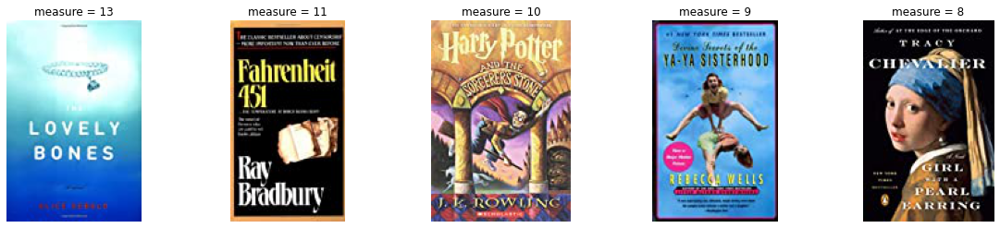

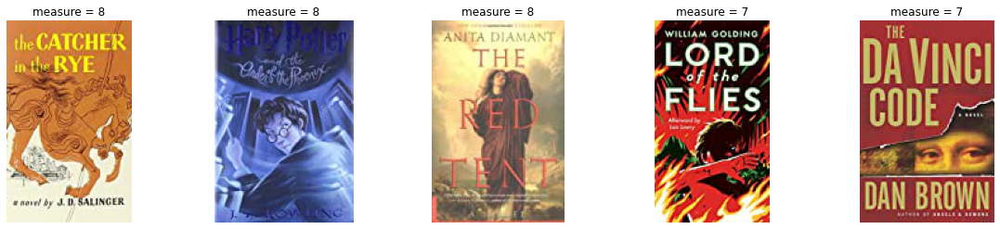

In [ ]:
PersonalTop(interactions, users).top('london, england, united kingdom', 28.0)

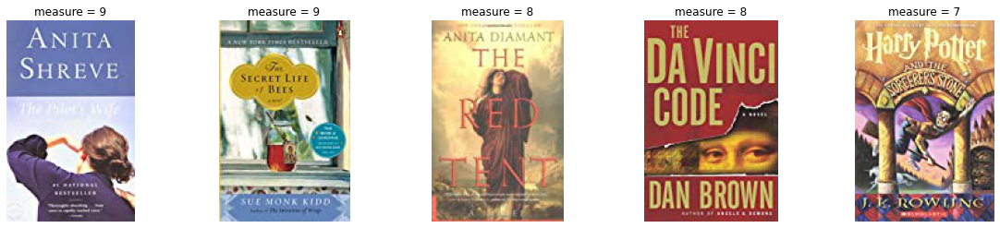

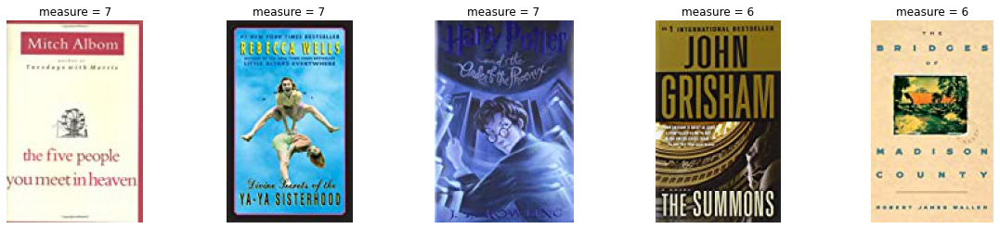

In [ ]:
PersonalTop(interactions, users).top('madrid, madrid, spain', 36.0)

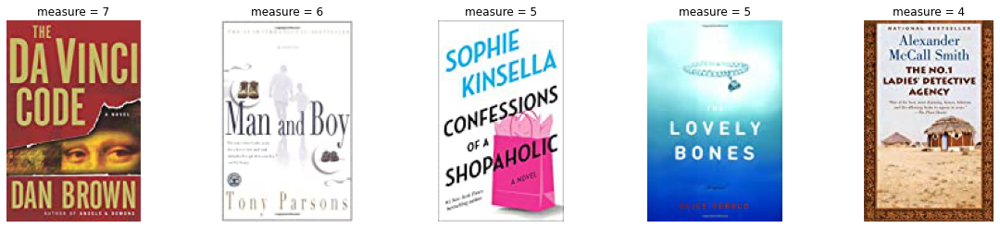

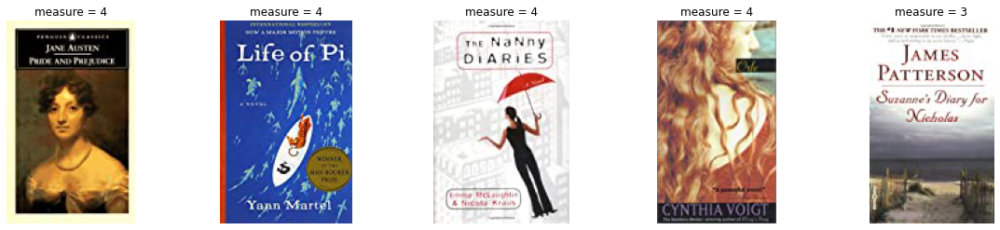

In [ ]:
PersonalTop(interactions, users).top('sydney, new south wales, australia', 50.0)

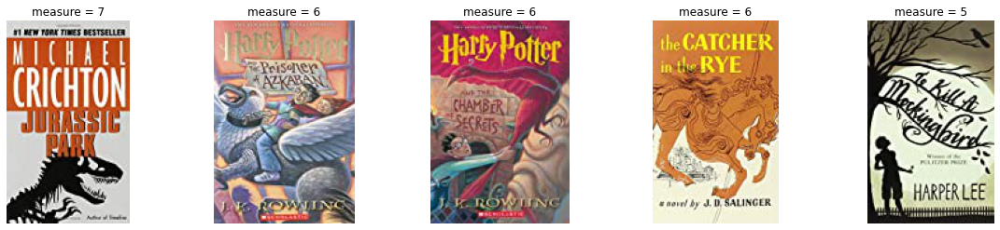

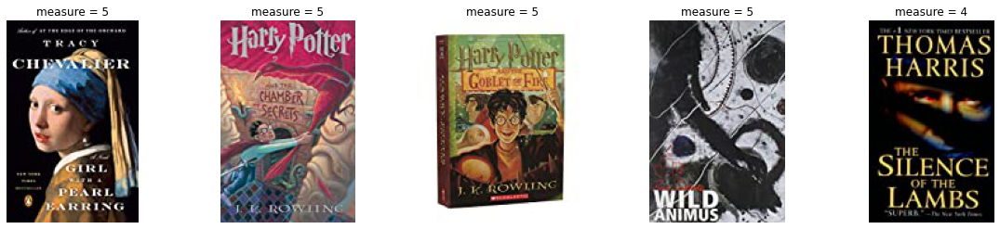

In [ ]:
PersonalTop(interactions, users).top('los angeles, california, usa', 18.0)

### 2. На основе метода кластеризации похожих пользователей построить рекомендации (Слайд 25) - 2 балла

Нужно топ-10 рекомендаций с самой высокой оценкой. Считаем среднюю оценку для каждой книги по кластеру и выводим топ-10 книг.

In [ ]:
class ClusterTop:
    def __init__(self, interactions_):
        self.interactions = interactions_
        self.vid = interactions_["vid"].unique()
        self.prod = interactions_["product_id"].unique()
        csr_rates = coo_matrix((interactions_["Book-Rating"], (interactions_["vid"], interactions_["product_id"])), 
                       shape=(self.vid.shape[0], self.prod.shape[0]))
        
        """
        здесь следующая идея: после создания разреженой матрицы буду вычислять сходство каждого
        пользователя между всеми юзерами. Полученный массив загоняю в другую метрику, которая дает число:
        сходство данного пользователя с другими. Собираю все такие числа и уже только потом кластеризую все
        сходства. Таким образом получается довольно неплохо сгруппировать пользователей
        """
        metrics = []
        for idx in self.vid:
            user_rates = csr_rates.getrow(idx).toarray()[0]
            watched_items = np.where(user_rates != 0)[0]
            metric = cosine_similarity([user_rates], csr_rates).reshape(-1, 1)
            metrics.append(np.sqrt(np.sum((metric - metric.mean())**2))/metric.shape[0])
            metrics.append(metric)
        metrics = np.array(metrics).reshape(-1, 1)
        kmean = KMeans(n_clusters=20, random_state=42).fit(metrics)

        self.clusters = kmean.labels_

    def __print_recomendations(self, data, nums):
        for i in range(nums):
            if i%5 == 0:
                fig = plt.figure(figsize=(20, 4))
            r = requests.get(data.loc[i]['picture_url'])
            im = Image.open(BytesIO(r.content))

            a = fig.add_subplot(1, 5, int(i%5) + 1)
            a.title.set_text("mean-rating = {}".format(np.round(data.loc[i]['Book-Rating'], 2)))
            plt.imshow(im)
            plt.axis('off')

    def top_by_cluster(self, idx):
        """
        здесь я получию номера vid всех пользователей того кластера, в котором находится пользователь с индексом idx
        """
        try:
            user_vid = self.interactions['vid'][np.where(self.interactions['User-ID'] == idx)[0][0]]
        except:
            print('Неверное User-ID')
            return
        
        cluster_id = self.clusters[list(self.vid).index(user_vid)]
        uni_idx = self.vid[np.where(self.clusters == cluster_id)[0]]
        Int = pd.DataFrame([], columns=self.interactions.columns)
        """
        затем в таблице interactions собираю всех найденных пользователей,
        группирую по книгам и считаю средний рейтинг. Вывожу топ 10 на печать
        """

        j = 0
        for i in range(self.interactions.shape[0]):
            if self.interactions.loc[i]['vid'] in uni_idx:
                Int.loc[j] = self.interactions.loc[i].values
                j += 1
        
        Int['Book-Rating'] = np.array(Int['Book-Rating'], dtype=np.float64)
        Int = pd.DataFrame(Int.groupby('ISBN')['Book-Rating'].mean().reset_index()).merge(self.interactions[['ISBN', 'picture_url']].drop_duplicates(), on='ISBN')
        Int = Int.sort_values(by='Book-Rating', ascending=False, ignore_index=True)
        self.__print_recomendations(Int, 10)

In [ ]:
cluster_top = ClusterTop(interactions)

1
2
3
4
5
6
7


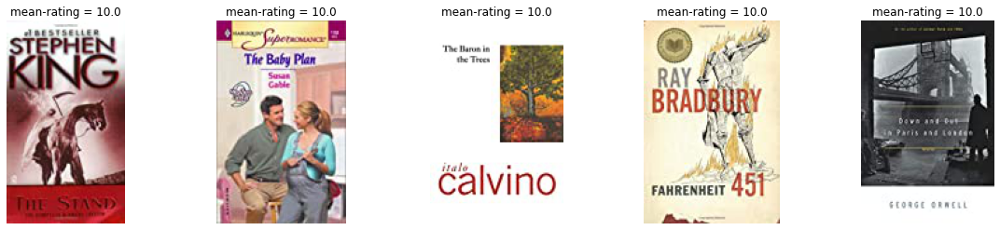

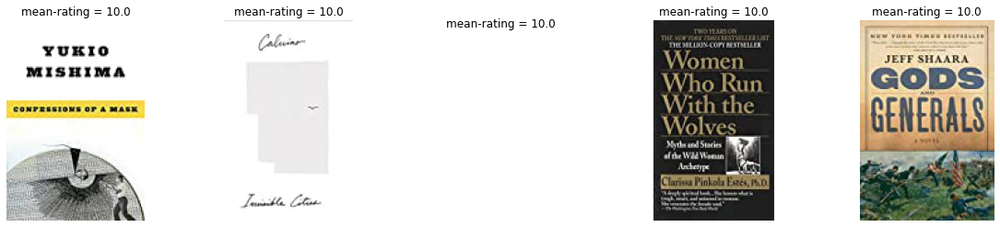

In [ ]:
cluster_top.top_by_cluster(276866)

1
2
3
4
5
6
7


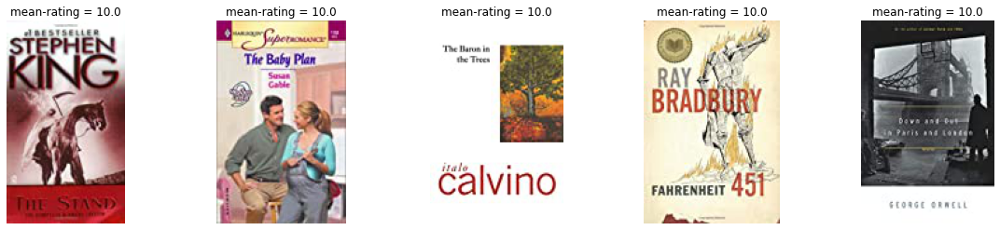

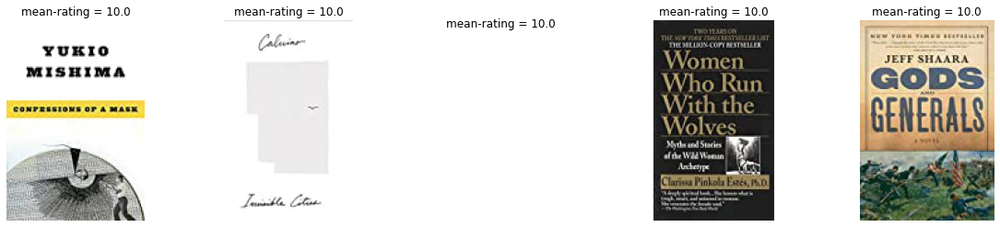

In [ ]:
cluster_top.top_by_cluster(86583)

1
2
3
4
5
6
7


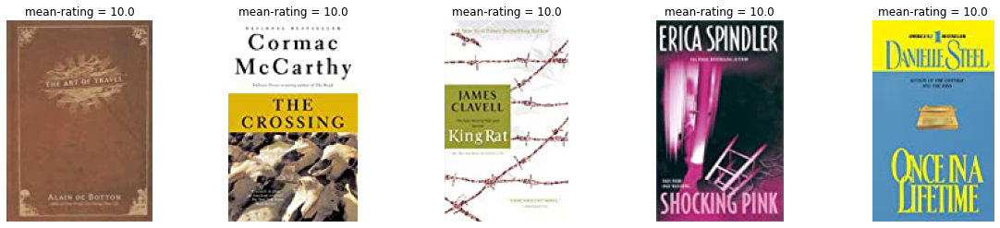

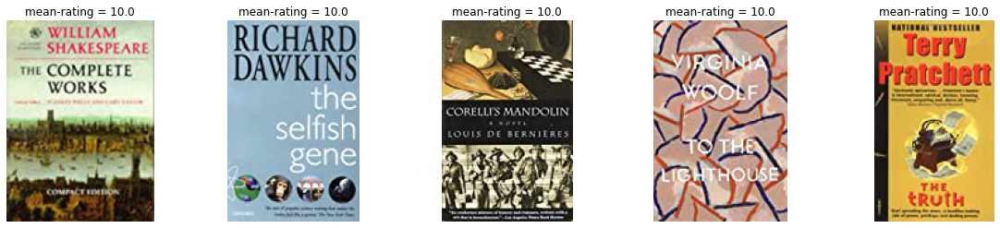

In [ ]:
cluster_top.top_by_cluster(8)

8 74782 276866

### 3. Применить методы расмотренные на лекции (Совстречаемость - 2 балл, Content-based - 1 балл, Коллаборативная фильтрация - 3 балла , Матричная Факторизация - 1 балл) - 7 баллов

В совстречаемости также учитывать оценки. Вес пары книг встретившихся у пользователя - полусумма их оценок

Коллаборативную фильтрацию реализовывать как на слайде 50 презентации, посоветовав каждому пользователю топ-10 книг с самой высокой оценкой. Сделать рекомендации User-based и Item-based и сравнить.

Если совсем сложно - можно сделать как в семинарской части, поставив оценку "0", если рейтинг < 5 и "1" - в противном случае. Тогда максимум за это - 1 балл.

Для Content-based, Коллаборативной фильтрации, Матричной Факторизации реализовать U2I и I2I рекомендации

In [ ]:
for i, j in interactions[["product_id", "Book-Title"]].drop_duplicates().values:
    if "Potter" in j:
        print("idx:", i, "\tBook Title:", j)

idx: 4233 	Book Title: Harry Potter and the Order of the Phoenix (Book 5)
idx: 7036 	Book Title: Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))
idx: 4216 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4226 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 7035 	Book Title: Harry Potter and the Sorcerer's Stone (Book 1)
idx: 4238 	Book Title: Harry Potter and the Chamber of Secrets Postcard Book
idx: 4224 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 3990 	Book Title: From Potter's Field
idx: 4227 	Book Title: Harry Potter and the Goblet of Fire (Book 4)
idx: 4217 	Book Title: Harry Potter and the Chamber of Secrets (Book 2)
idx: 4225 	Book Title: Harry Potter and the Prisoner of Azkaban (Book 3)
idx: 8836 	Book Title: The Sorcerer's Companion: A Guide to the Magical World of Harry Potter
idx: 9732 	Book Title: Ultimate Unofficial Guide to the Mysteries of Harry Potter
idx: 4234 	Book Title: Harry Potter and the So

#### Совстречаемость

In [ ]:
class Recomendations():
    def __init__(self, Int):
        self.product_id_to_url = {}
        for i in Int[["product_id", "picture_url", "Book-Rating"]].drop_duplicates().values:
            self.product_id_to_url[i[0]] = i[1]
        self.interactions = Int
        
    def coocurrency_count(self):
        Int = self.interactions[["vid", "product_id", "Book-Rating"]].drop_duplicates()
        user_products = Int.groupby(["vid"])["product_id"].apply(list).reset_index().merge(Int.groupby(['vid'])['Book-Rating'].apply(list), on='vid')
        product_num = [len(i) for i in user_products["product_id"]]
        user_products["prod_num"] = product_num
        user_products = user_products[user_products["prod_num"] > 1]
        
        cooc = {}
        for i in tqdm.tqdm_notebook(user_products.values):
            for j in range(len(i[1])):
                for k in range(len(i[1])):
                    if j != k:
                        try:
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] += 1
                            # добавлю вес от оценки книг
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] += (i[2][j] + i[2][k]) / 2.0
                        except:
                            cooc[str(i[1][j]) + "_" + str(i[1][k])] = 1
        
        cooc_list = []
        for i, j in cooc.items():
            if j != 1:
                cooc_list.append(i.split("_") + [j])
        self.cooc_rec = pd.DataFrame(cooc_list, columns=["item1", "item2", "measure"])
    
    def get_rec(self, i, show=False):
        recs = self.cooc_rec[self.cooc_rec["item1"] == str(i)]\
                            .sort_values("measure", ascending=False)\
                            .head(10)
        print(u"Для товара")
        rec_imaging([i], self.product_id_to_url)
        print(u"Такие рекомендации")
        rec_imaging(recs["item2"].values.astype(int), self.product_id_to_url, 
                         recs["measure"].values.astype(int))

In [ ]:
cooc_rec = Recomendations(interactions)
cooc_rec.coocurrency_count()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  app.launch_new_instance()


Для товара


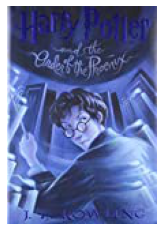

Такие рекомендации


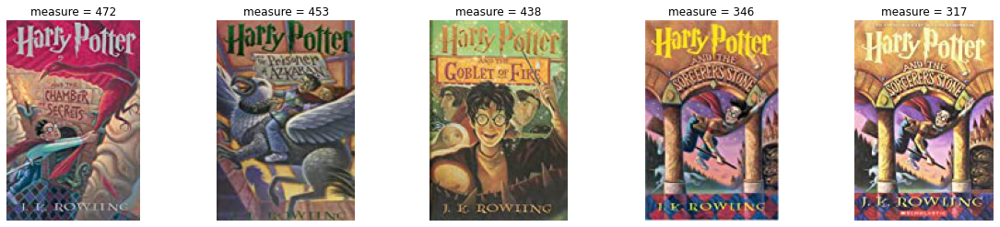

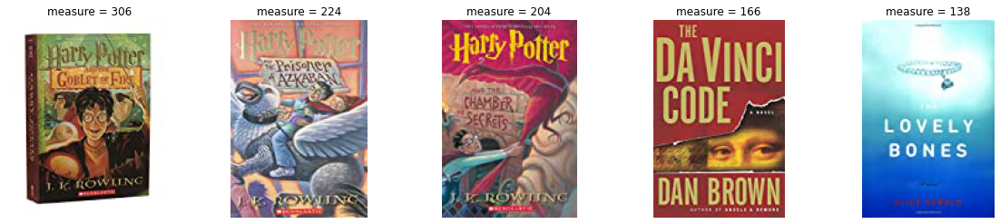

In [ ]:
cooc_rec.get_rec(4233)

Для товара


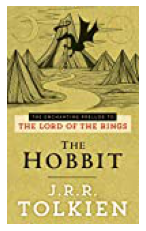

Такие рекомендации


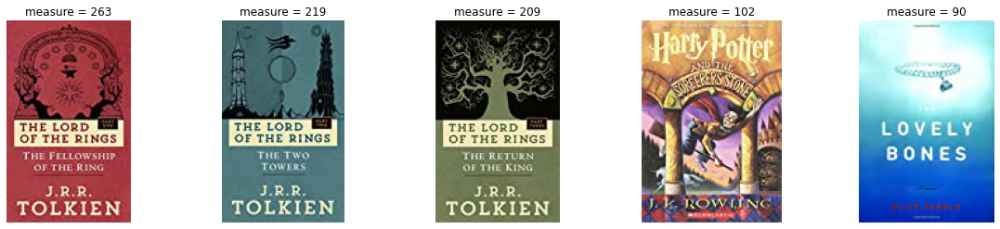

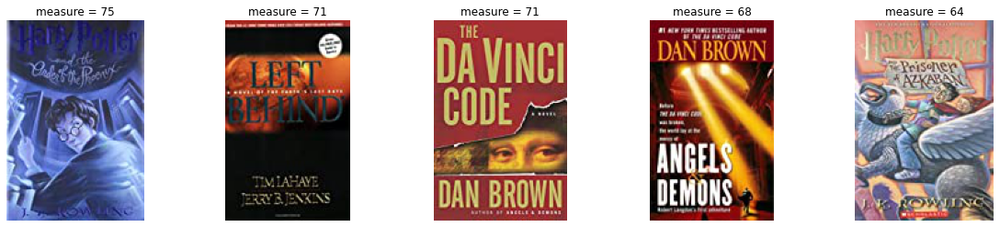

In [ ]:
cooc_rec.get_rec(1921)

Для товара


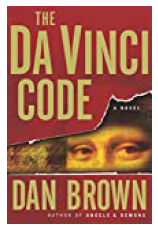

Такие рекомендации


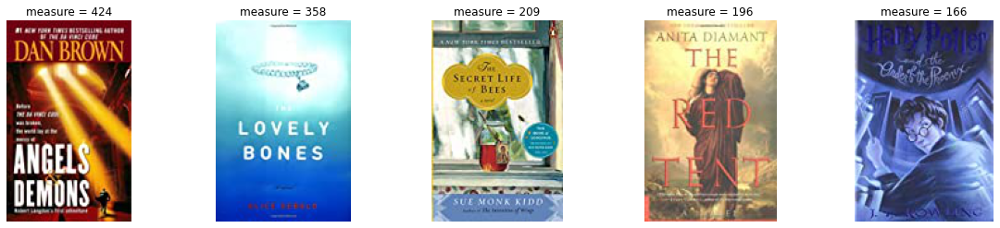

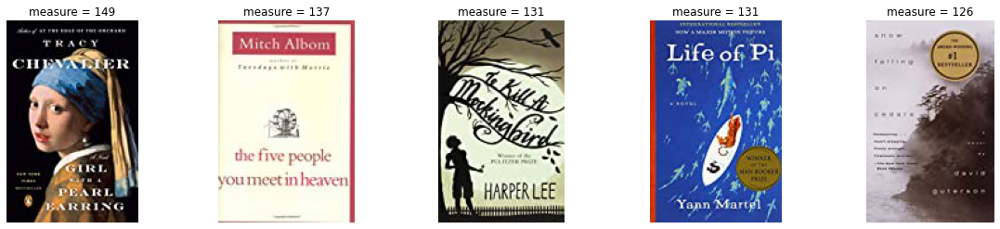

In [ ]:
cooc_rec.get_rec(3461)

#### Content-based

In [ ]:
class Content_Based():    
    def __init__(self, books, interactions):
        interactions = interactions.merge(books[['ISBN', 'Book-Author', 'Year-Of-Publication', 'Publisher']].drop_duplicates(), on='ISBN')
        self.items = pd.DataFrame(interactions[['Book-Title', 'Book-Author', 'Year-Of-Publication', 'Publisher']].astype(str).sum(1), columns=['text']).drop_duplicates().reset_index().drop(columns=['index'])
        self.interactions = interactions
        self.interactions['text'] = interactions[['Book-Title', 'Book-Author', 'Year-Of-Publication', 'Publisher']].astype(str).sum(1).values
        self.content_dict = {}
        for i, j in enumerate(interactions["picture_url"]):
            self.content_dict[i] = j
        self.inversed_dict = {v: k for k, v in self.content_dict.items()}
        
    def avg_feature_vector(self, words, model, num_features, index2word_set):
        feature_vec = np.zeros((num_features, ), dtype='float32')
        n_words = 0
        for word in words:
            if word in index2word_set:
                n_words += 1
                feature_vec = np.add(feature_vec, model.wv[word])
        if (n_words > 0):
            feature_vec = feature_vec / n_words
        return feature_vec

    def get_items_representation(self):
        
        item_description = [gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", i.lower())) 
                            for i in self.items['text']]
        #build vocabulary and train model
        self.model = gensim.models.Word2Vec(
                item_description,
                size=200,
                window=10,
                min_count=1,
                workers=10,
                iter=100)
        self.index2word_set = set(self.model.wv.index2word)
        self.items_embs = np.zeros((len(item_description), 200))
        for i in range(self.items_embs.shape[0]):
            self.items_embs[i] = self.avg_feature_vector(item_description[i], self.model, 200, self.index2word_set)
        
        
    def get_rec_I2I(self, i):
        metrics = cosine_similarity([self.items_embs[i]], self.items_embs)
        print(u"Для товара")
        rec_imaging([i], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.content_dict, np.sort(metrics)[0][::-1][1:11])


    def get_rec_U2I(self, i):
        ui = self.interactions[self.interactions["vid"] == i]
        user_vector = " ".join(ui["text"])
        user_processed = gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", user_vector.lower()))
        user_emb = self.avg_feature_vector(user_processed, self.model, 200, self.index2word_set)
        metrics = cosine_similarity([user_emb], self.items_embs)
        print(u"Для пользователя, который взаимодействовал с товарами")
        rec_imaging(np.unique([self.inversed_dict[i] for i in ui["picture_url"]]), self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(metrics)[0][::-1][1:11], self.content_dict, np.sort(metrics)[0][::-1][1:11])

In [ ]:
CB = Content_Based(books, interactions)

In [ ]:
CB.get_items_representation()

Для товара


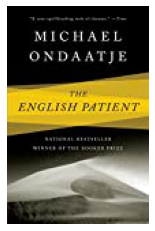

Такие рекомендации


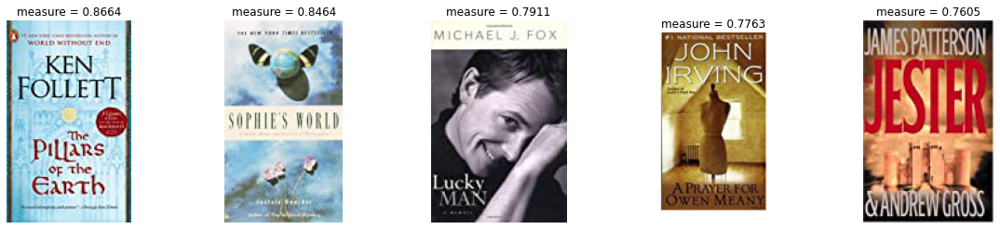

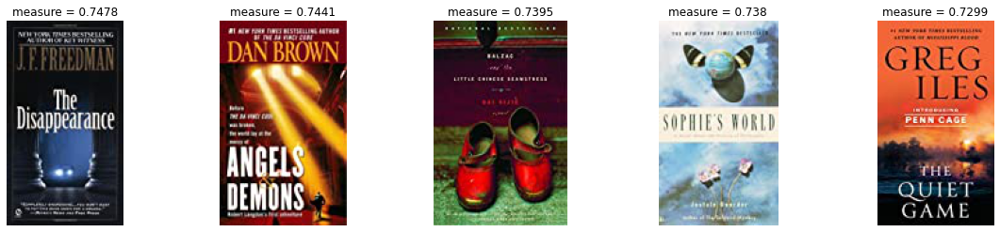

In [ ]:
CB.get_rec_I2I(1100)

Для товара


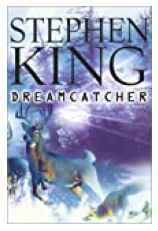

Такие рекомендации


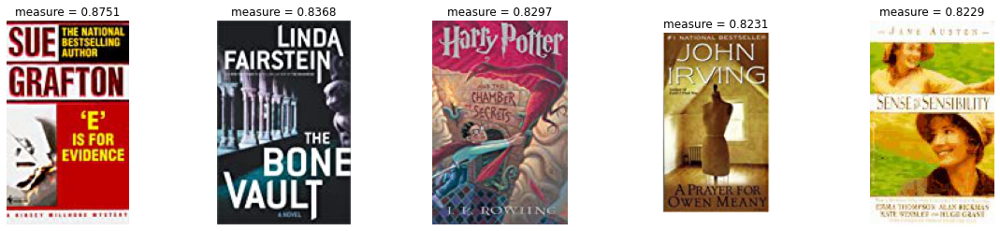

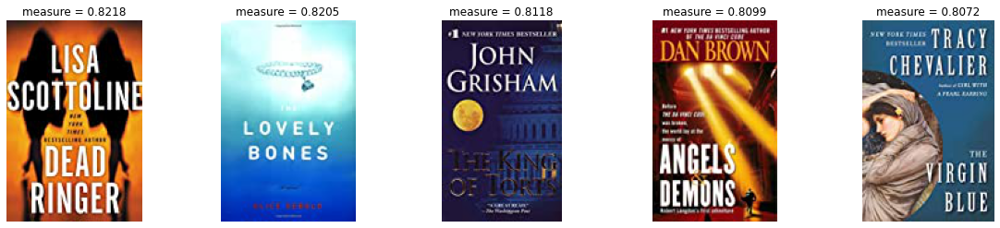

In [ ]:
CB.get_rec_I2I(111)

Для пользователя, который взаимодействовал с товарами


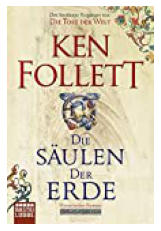

Такие рекомендации


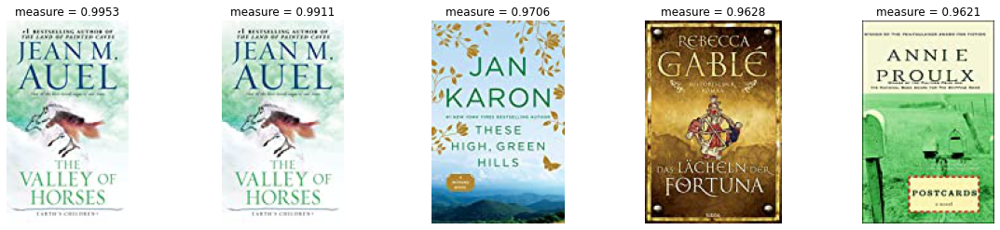

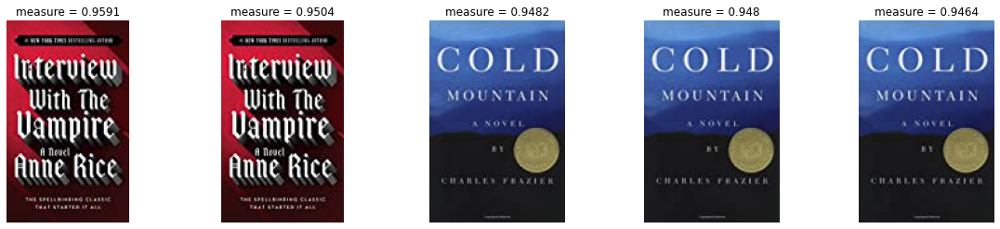

In [ ]:
CB.get_rec_U2I(3212)

Для пользователя, который взаимодействовал с товарами


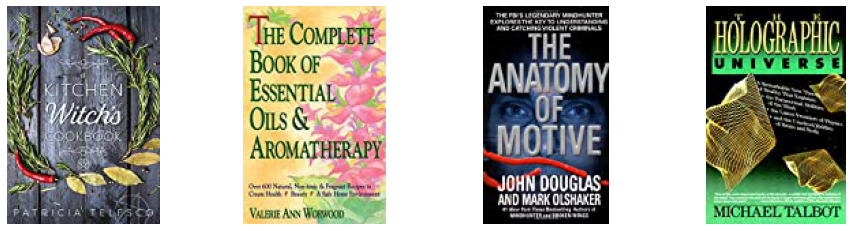

Такие рекомендации


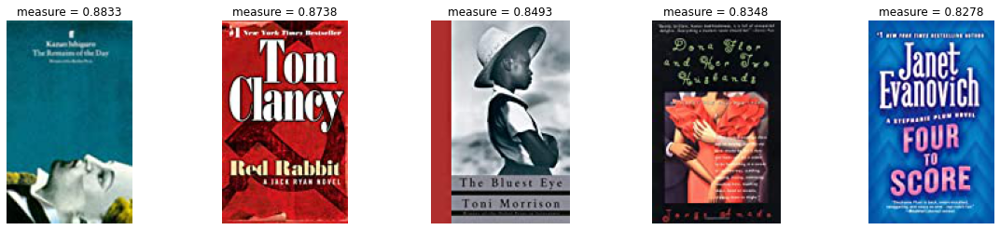

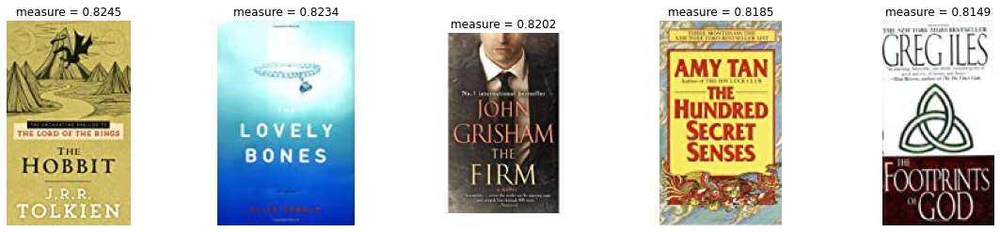

In [ ]:
CB.get_rec_U2I(333)

#### Коллаборативная фильтрация

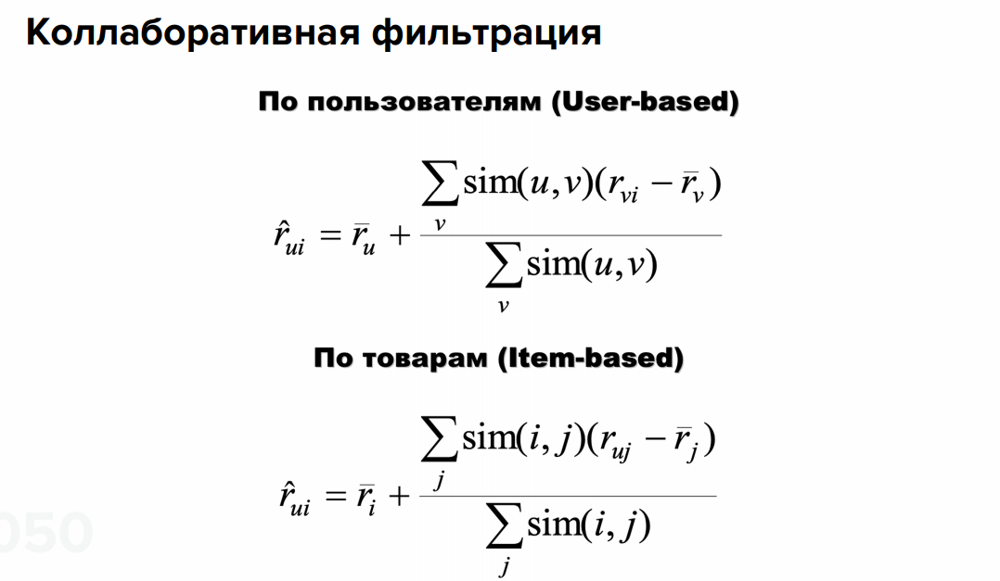

In [ ]:
def rec_imaging(product_ids, content_dict, measure=None, top_n=5):
    picture_urls = [content_dict[i] for i in product_ids]
    cnt = 0
    for idx, chunk in enumerate(chunks(picture_urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [ ]:
"""
        # считаем косинус между пользователем idx и всеми пользователями
        user_rates = self.csr_rates.getrow(idx).toarray()[0]
        # коэффициент похожести sim(u, v)
        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
        watched_items = np.where(user_rates != 0)[0]
        # средний рейтинг, который пользователь выставил просмотренным книгам
        mean_user_rate = user_rates[watched_items].mean()

        chis = np.zeros(metrics.shape)
        zn = np.zeros(metrics.shape)
        for i in watched_items:
            book_rates = self.csr_rates.getcol(i).toarray().reshape(1, -1)[0]
            mean_rate = np.delete(book_rates, np.where(book_rates == 0)[0]).mean()
            chis += metrics * (book_rates - mean_rate)
            zn += metrics

        zero_indexes = np.where(zn == 0)[0]
        total_rate = mean_user_rate + chis / zn
        total_rate[zero_indexes] = 0.0
        total_rate[watched_items] == 0.0
        total_rate = total_rate.ravel()
        
        print(watched_items)
        print(np.argsort(total_rate)[::-1][:10])
        print(self.csr_rates.shape)
        print(np.arange(self.csr_rates.shape[0])[np.argsort(total_rate)[::-1][:10]])
        print(np.sort(total_rate)[::-1][:10])
        # печатаем рекомендации
        self.get_rec(watched_items, np.arange(self.csr_rates.shape[0])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])
"""
# неудачная попытка реализовать алгоритм

'\n        # считаем косинус между пользователем idx и всеми пользователями\n        user_rates = self.csr_rates.getrow(idx).toarray()[0]\n        # коэффициент похожести sim(u, v)\n        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)\n        watched_items = np.where(user_rates != 0)[0]\n        # средний рейтинг, который пользователь выставил просмотренным книгам\n        mean_user_rate = user_rates[watched_items].mean()\n\n        chis = np.zeros(metrics.shape)\n        zn = np.zeros(metrics.shape)\n        for i in watched_items:\n            book_rates = self.csr_rates.getcol(i).toarray().reshape(1, -1)[0]\n            mean_rate = np.delete(book_rates, np.where(book_rates == 0)[0]).mean()\n            chis += metrics * (book_rates - mean_rate)\n            zn += metrics\n\n        zero_indexes = np.where(zn == 0)[0]\n        total_rate = mean_user_rate + chis / zn\n        total_rate[zero_indexes] = 0.0\n        total_rate[watched_items] == 0.0\n       

In [ ]:
class Colloborative():
    def __init__(self, interactions):
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        weighted = interactions[["vid", "product_id", "picture_url", "Book-Rating"]]
        self.csr_rates = coo_matrix((weighted["Book-Rating"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))

    def user_based(self, idx):
        # считаем косинус между пользователем idx и всеми пользователями
        user_rates = self.csr_rates.getrow(idx).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
        # домножаем оценки пользователя на коэффициент похожести
        rates = csr_matrix.multiply(self.csr_rates.copy(), metrics)
        # чтобы не рекомендовать уже просмотренные - зануляем веса просмотренных
        total_rate = (1 - user_rates.astype(bool)) * np.array(np.sum(rates, axis=0))[0]
        # печатаем рекомендации
        self.get_rec(watched_items, np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])
        
    def item_based(self, idx):
        # считаем косинус между пользователем idx и всеми пользователями
        item_rates = self.csr_rates.getcol(idx).toarray().reshape(1, -1)
        metrics = cosine_similarity(item_rates, self.csr_rates.T).reshape(-1, 1)
        # домножаем оценки пользователя на коэффициент похожести
        rates = csr_matrix.multiply(self.csr_rates.T.copy(), metrics)
        total_rate = np.array(np.sum(rates, axis=1)).ravel()
        # печатаем рекомендации
        self.get_rec([idx], np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

    def get_rec(self, watched, recs, measure):
        print(u"Для таких товаров")
        rec_imaging([i for i in watched], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict, measure)

In [ ]:
clb = Colloborative(interactions)

Для таких товаров


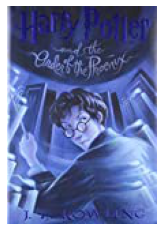

Такие рекомендации


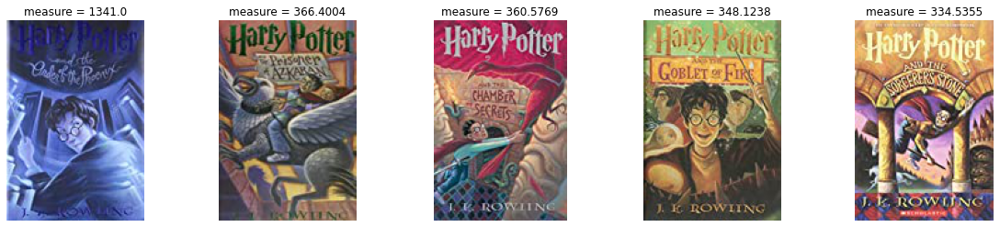

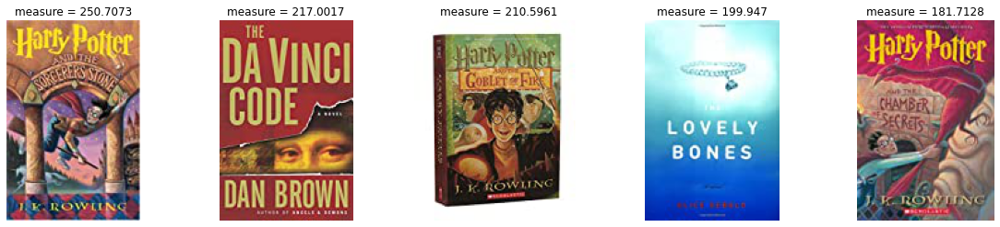

In [ ]:
clb.item_based(4233)

Для таких товаров


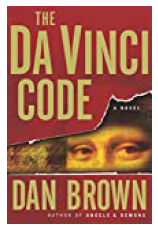

Такие рекомендации


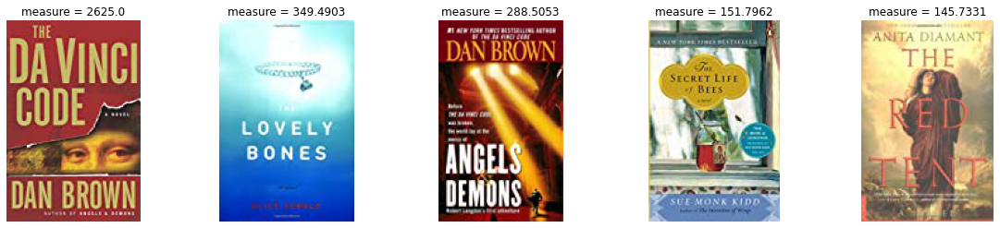

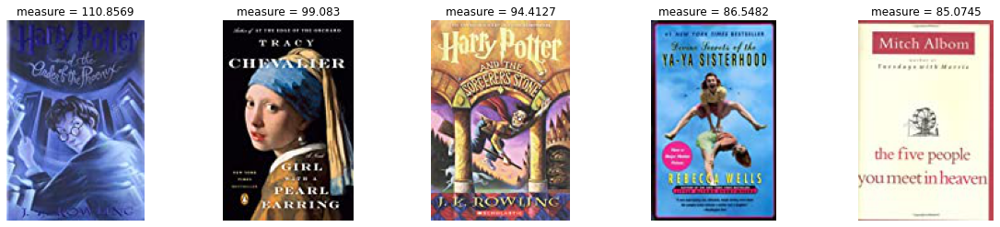

In [ ]:
clb.item_based(3461)

##### Здесь я честно пытался реализовать алогитм, по идее же по формуле сделал но рекомендации, конечно, ужасны

Поэтому прошу указать на ошибку, не смог сам найти

In [ ]:
class Colloborative():
    def __init__(self, interactions):
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[int(i)] = j
        weighted = interactions[["vid", "product_id", "picture_url", "Book_Rating"]]
        self.csr_rates = coo_matrix((weighted["Book_Rating"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))

    def user_based(self, idx):
        # считаем косинус между пользователем idx и всеми пользователями
        user_rates = self.csr_rates.getrow(idx).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        metrics = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
        
        rating = []
        # для каждой книги
        for i in range(self.csr_rates[1]):
            # нахожу ее оценки
            item_rates = self.csr_rates.getcol(i).toarray().reshape(1, -1)[0]
            # нахожу юзеров, поставивших ей оценку
            readed_user = np.where(item_rates != 0)[0]
            sum = 0
            for v in readed_user:
                if v == idx:
                  continue
                # нахожу оценки пользователя v
                v_rate = self.csr_rates.getrow(v).toarray()[0]
                v_mean = v_rate[np.where(v_rate != 0)[0]].mean()
                # умножаю сходство пользователя v с юзером user на (оценку книги пользователем v - среднюю оценку этого пользователя v)
                sum += metrics[v][0] * (item_rates[v] - v_mean)
                
            rating.append(user_rates[watched_items].mean() + sum / item_rates[readed_user].sum())
        
        total_rate = np.array(rating).reshape(len(rating),)
        # печатаем рекомендации
        self.get_rec(watched_items, np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])
        
    def item_based(self, idx):
        # считаем косинус между пользователем idx и всеми пользователями
        item_rates = self.csr_rates.getcol(idx).toarray().reshape(1, -1)
        marked_books = np.where(item_rates[0] != 0)[0]
        metrics = cosine_similarity(item_rates, self.csr_rates.T).reshape(-1, 1)
        # домножаем оценки пользователя на коэффициент похожести
        rating = []
        for u in range(self.csr_rates.shape[0]):
            user_rates = self.csr_rates.getrow(u).toarray()[0]
            readed_books = np.where(user_rates != 0)[0]
            sum = 0
            for j in readed_books:
                if j == idx:
                    continue
            j_rate = self.csr_rates.getcol(idx).toarray().reshape(1, -1)[0]
            j_mean = j_rate[np.where(j_rate != 0)[0]].mean()
            sum += metrics[j][0] * (user_rates[j] - j_mean)
        rating.append(item_rates[0][marked_books].mean() + sum / user_rates[readed_books].sum())
        total_rate = np.array(rating).reshape(len(rating),)
        # печатаем рекомендации
        self.get_rec([idx], np.arange(self.csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

    def get_rec(self, watched, recs, measure):
        print(u"Для таких товаров")
        rec_imaging([i for i in watched], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging([i for i in recs], self.content_dict, measure)

Для таких товаров


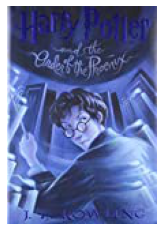

Такие рекомендации


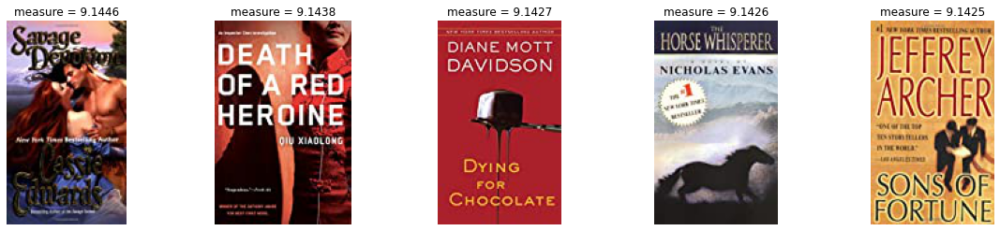

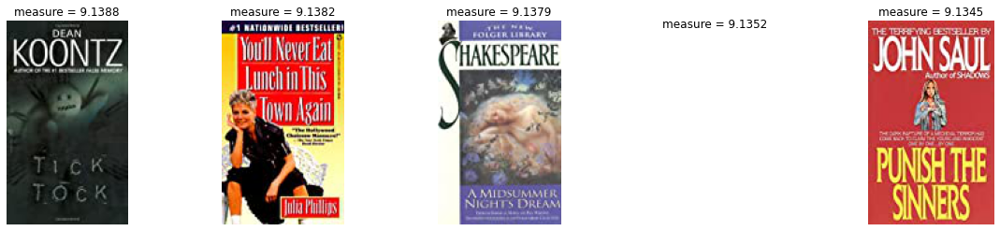

In [ ]:
def get_rec(watched, recs, measure):
    print(u"Для таких товаров")
    rec_imaging([i for i in watched], content_dict)
    print(u"Такие рекомендации")
    rec_imaging([i for i in recs], content_dict, measure)

get_rec([idx], np.arange(csr_rates.shape[1])[np.argsort(total_rate)[::-1][:10]],
                    np.sort(total_rate)[::-1][:10])

#### Матричная факторизация

In [ ]:
class MatrixFactorization():
    
    def __init__(self, interactions, k):
        interactions["product_id"] = interactions["product_id"].astype(int)
        self.k = k
        self.content_dict = {}
        for i, j in interactions[["product_id", "picture_url"]].drop_duplicates().values:
            self.content_dict[i] = j
        weighted = interactions[['vid', 'product_id', 'picture_url', 'Book-Rating']]
        self.csr_rates = coo_matrix((weighted["Book-Rating"], (weighted["vid"], weighted["product_id"])), 
                            shape=(len(set(weighted["vid"])), len(set(weighted["product_id"]))))
        
    def MF(self):
        U, S, V = svds(self.csr_rates.astype(float), k=self.k)
        self.user_embs = U
        self.items_embs = V.T
        
    def LightFM(self):
        self.model = LightFM(loss='warp', no_components=100, learning_rate=0.03, learning_schedule="adadelta")
        self.model.fit(self.csr_rates, epochs=5, num_threads=40, verbose=True)
        self.user_feature_bias, self.user_feature_embeddings = self.model.get_user_representations()
        self.item_feature_bias, self.items_embs = self.model.get_item_representations()

    def get_rec_I2I(self, i):
        metrics = cosine_similarity([self.items_embs[i]], self.items_embs)
        print(u"Для товара")
        rec_imaging([i], self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(-metrics)[0][1:11], self.content_dict, -np.round(np.sort(-metrics)[0][1:11], 4))
    
    def get_rec_U2I(self, i):
        user_rates = self.csr_rates.getrow(i).toarray()[0]
        watched_items = np.where(user_rates != 0)[0]
        items = user_rates[watched_items]
        metrics = cosine_similarity([self.user_embs[i]], self.user_embs)
        print(u"Для пользователя, который взаимодействовал с товарами")
        rec_imaging(items, self.content_dict)
        print(u"Такие рекомендации")
        rec_imaging(np.argsort(-metrics)[0][1:11], self.content_dict, -np.round(np.sort(-metrics)[0][1:11], 4))

In [ ]:
simple_svd = MatrixFactorization(interactions, 30)
simple_svd.MF()

Для товара


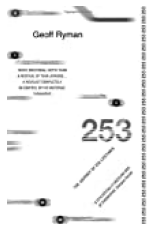

Такие рекомендации


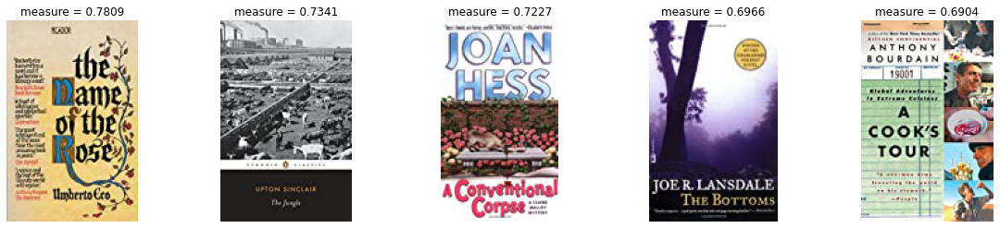

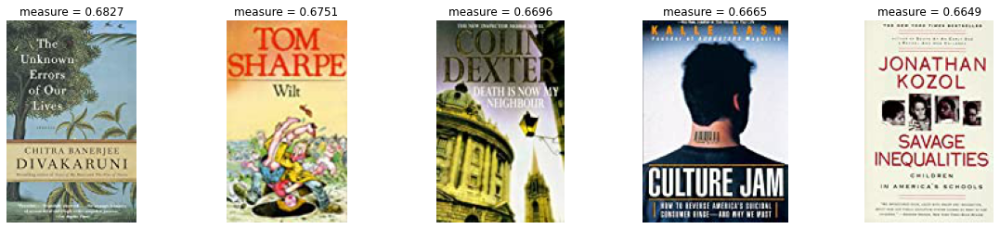

In [ ]:
simple_svd.get_rec_I2I(10)

Для товара


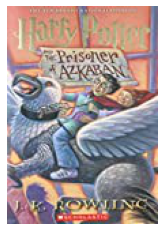

Такие рекомендации


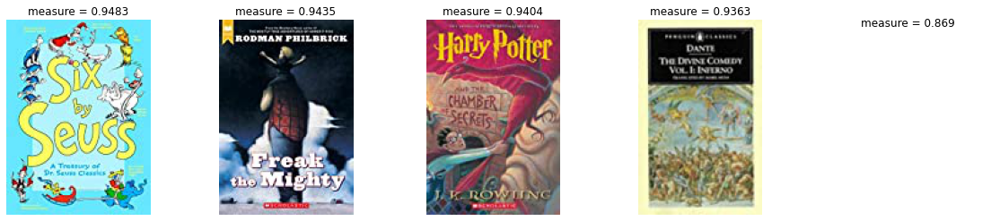

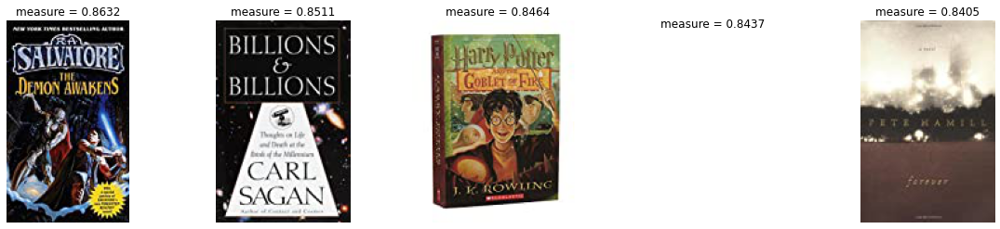

In [ ]:
simple_svd.get_rec_I2I(4225)

Для пользователя, который взаимодействовал с товарами


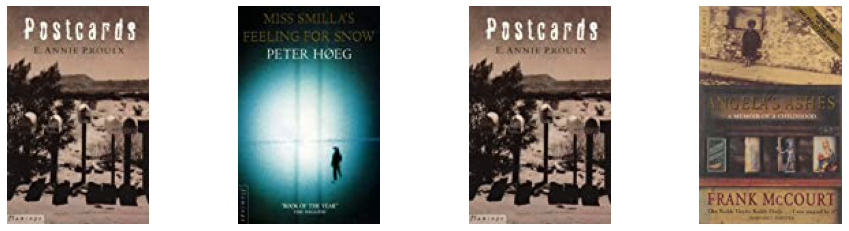

Такие рекомендации


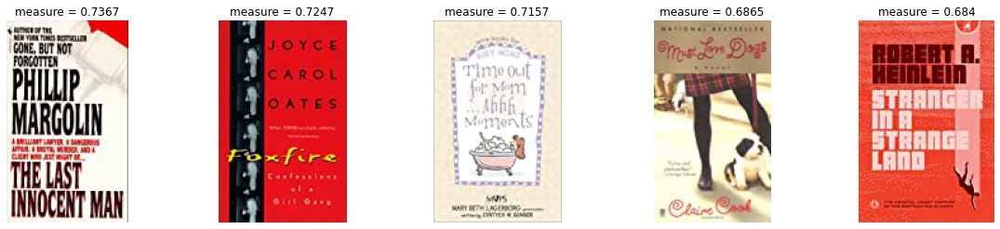

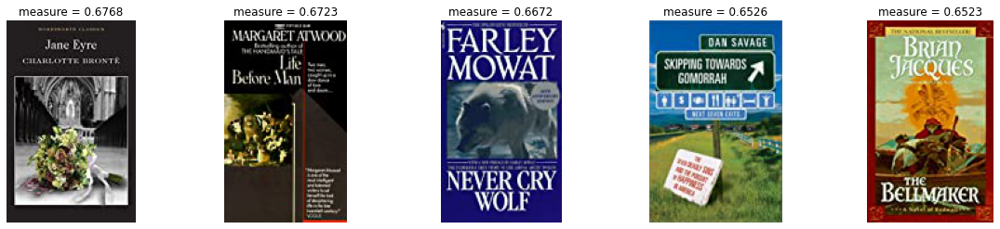

In [ ]:
simple_svd.get_rec_U2I(12)

Для пользователя, который взаимодействовал с товарами


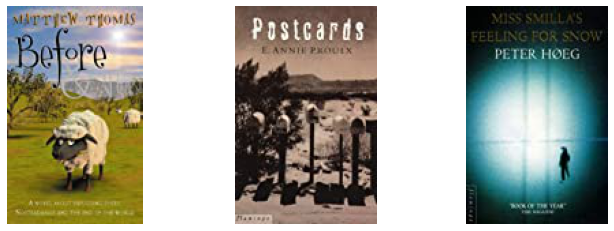

Такие рекомендации


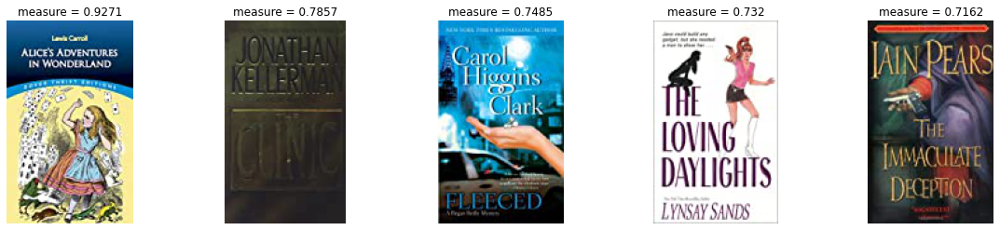

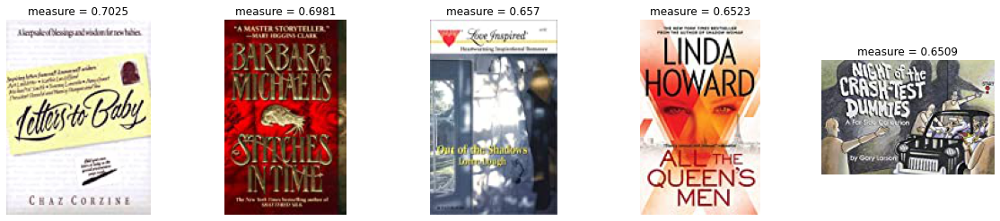

In [ ]:
simple_svd.get_rec_U2I(666)